Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy.stats import linregress
%matplotlib inline

Reading Datasets as Dataframes

##### enter the exact file paths of TR2 file and excel sheet

In [2]:
header_list_zwick = ["col1", "col2", "col3", "t(s)", "axial_displ(mm)","force(N)", "col7"] 
col_list = [ "t(s)", "axial_displ(mm)","force(N)"]
df_zwick = pd.read_csv('UCS-3DPrinted_3.TR2',sep = ";", header = 356 ,names = header_list_zwick, skiprows=lambda x: x > 33380, usecols= col_list)

header_list_hbm =["t(s)", "radial_displ(mm)"]
df_hbm= pd.read_excel('Chain_2022_01_19_11_15_46.xls',header = 48, names = header_list_hbm, usecols = "A,B")

Rounding t-values to 1 decimal

In [3]:
df_zwick['t(s)'] = df_zwick['t(s)'].round(1)
df_hbm['t(s)'] = df_hbm['t(s)'].round(1)

Merging the two datasets ( zwick and HBM) and dropping NaN values

In [4]:
df = pd.merge (df_zwick, df_hbm, on = 't(s)', how= 'right')
df.drop_duplicates (subset = ['t(s)'], keep = 'last', inplace = True)
df.reset_index(drop=True, inplace = True)
df.dropna(inplace = True)

displaying the entire dataframe

In [5]:
pd.set_option("display.max_rows",20067)
#print(df)

##### Entering UCS sample parameters in mm

In [6]:
d = 50          ## sample diameter
l = 100         ## sample length
sgf = 1.063086  ## strain-gauge-factor

area = np.pi*d**2/4/1000000  ## in m2
circumf = np.pi*d

calculation of axial stress, axial strain, radial strain and volumetric strain

In [7]:
df["axial_stress(MPa)"] = df["force(N)"]/area/1000000  ## in MPa

df["axial_strain(%)"] = 100 * (df["axial_displ(mm)"] - df.iat[0,1])/l

df["radial_strain(%)"] = 100 * sgf * (df["radial_displ(mm)"] - df.iat[0,3])/circumf

df["volumetric_strain(%)"] = 2*df["radial_strain(%)"] + df["axial_strain(%)"]

df

,t(s),axial_displ(mm),force(N),radial_displ(mm),axial_stress(MPa),axial_strain(%),radial_strain(%),volumetric_strain(%)
0,0.0,0.000000e+00,-0.061301,3.778935e-05,-0.000031,0.000000e+00,0.000000e+00,0.000000
1,0.1,6.912160e-11,-0.693869,4.352513e-05,-0.000353,6.912160e-11,3.881867e-06,0.000008
2,0.2,-4.749745e-08,-0.523459,4.778070e-05,-0.000267,-4.749745e-08,6.761963e-06,0.000013
3,0.3,6.912160e-11,-0.172873,6.091748e-05,-0.000088,6.912160e-11,1.565269e-05,0.000031
4,0.4,6.912160e-11,-0.167014,3.020333e-05,-0.000085,6.912160e-11,-5.134081e-06,-0.000010
5,0.5,6.912160e-11,-0.267112,2.483760e-05,-0.000136,6.912160e-11,-8.765505e-06,-0.000018
7,0.7,6.912160e-11,-0.266868,5.018603e-05,-0.000136,6.912160e-11,8.389841e-06,0.000017
8,0.8,6.196483e-05,0.404275,4.500533e-05,0.000206,6.196483e-05,4.883639e-06,0.000072
9,0.9,8.268317e-05,-0.010764,3.723428e-05,-0.000005,8.268317e-05,-3.756649e-07,0.000082
10,1.0,1.446955e-04,0.041970,4.537538e-05,0.000021,1.446955e-04,5.134083e-06,0.000155


plotting 

<Figure size 432x288 with 0 Axes>

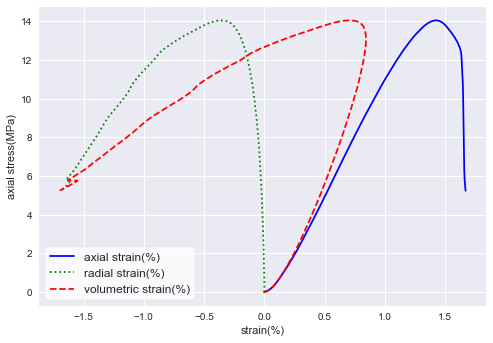

<Figure size 1440x1440 with 0 Axes>

In [8]:
fig = plt.figure();
plt.style.use("seaborn");


ax= df.plot(x="axial_strain(%)", y= "axial_stress(MPa)", c='b',linestyle='-', label='axial strain(%)');
df.plot(x="radial_strain(%)", y= "axial_stress(MPa)", c='g', linestyle=':', label='radial strain(%)', ax=ax);
df.plot(x="volumetric_strain(%)", y= "axial_stress(MPa)", c='r', linestyle ="--", label='volumetric strain(%)', ax=ax);

ax.xaxis.set_major_locator(ticker.MultipleLocator(0.5))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(0.1))


ax.set_xlabel('strain(%)');
ax.set_ylabel('axial stress(MPa)');


#ax.set_xlim(min,max);
#ax.set_ylim(min,max);

plt.legend(loc='best', fancybox=True, facecolor= "white", frameon=True, fontsize = "large");

plt.figure(figsize=(20,20));
plt.show;

### Calculating the Young's modulus

dropping the rows that are beyond the max_stress value

In [9]:
max_index = df["axial_stress(MPa)"].idxmax()
max_index

17129

In [10]:
df = df[df.index < max_index]
#df

##### Use the tool presented below to zoom into the linear elastic region and extract its STRESS-Value boundaries, insert them in the next cell.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
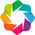

:Curve   [strain (%)]   (stress (MPa))

In [11]:
import holoviews as hv
hv.extension('bokeh')
import bokeh

hv.Curve((df["axial_strain(%)"], df["axial_stress(MPa)"]),'strain (%)','stress (MPa)')


In [12]:
lower_bound = 0.6      # in MPa
upper_bound = 10.6

E_stress = df["axial_stress(MPa)"][df["axial_stress(MPa)"].between(lower_bound,upper_bound)]
E_strain = df["axial_strain(%)"][df["axial_stress(MPa)"].between(lower_bound,upper_bound)]
#E_strain

In [13]:
res = linregress(E_strain, E_stress)
res

LinregressResult(slope=12.132741673913314, intercept=-1.0666668530476322, rvalue=0.9996393360741946, pvalue=0.0, stderr=0.003232399517152466, intercept_stderr=0.001914663502481529)

In [14]:
E = res[0]
E

12.132741673913314